# 1. Global colour histogram

In [1]:
# 1 Feature Extraction function

import cv2
import numpy as np
import matplotlib.pyplot as plt

def feature_extractor(img, q=32):
    # Quantize each channel
    r_quantized = np.floor(img[:, :, 2] * q).astype(int)  # Normalized [0,1] to 0-q bins
    g_quantized = np.floor(img[:, :, 1] * q).astype(int)
    b_quantized = np.floor(img[:, :, 0] * q).astype(int)

    # Calculate the flattened index for each pixel
    bin_indices = (r_quantized * (q ** 2) + g_quantized * q + b_quantized).flatten()
    
    # Calculate the histogram using np.histogram
    hist, _ = np.histogram(bin_indices, bins=q ** 3, range=(0, q ** 3))
    
    # Normalize the histogram
    normalized_histogram = hist / np.sum(hist) if np.sum(hist) > 0 else hist

    return normalized_histogram.astype(float)


In [2]:
# 2 Compute Descriptor

import os
import numpy as np
import cv2
import scipy.io as sio
# from extractRandom import extractRandom

DATASET_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/msrc_objcategimagedatabase_v2/MSRC_ObjCategImageDatabase_v2'
OUT_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/descriptors'
OUT_SUBFOLDER = 'globalRGBhisto'

# Ensure the output directory exists
os.makedirs(os.path.join(OUT_FOLDER, OUT_SUBFOLDER), exist_ok=True)

# Iterate through all BMP files in the dataset folder
for filename in os.listdir(os.path.join(DATASET_FOLDER, 'Images')):
    if filename.endswith(".bmp"):
        print(f"Processing file {filename}")
        img_path = os.path.join(DATASET_FOLDER, 'Images', filename)
        img = cv2.imread(img_path).astype(np.float64) / 255.0  # Normalize the image
        fout = os.path.join(OUT_FOLDER, OUT_SUBFOLDER, filename.replace('.bmp', '.mat'))
        
        # Call extractRandom (or another feature extraction function) to get the descriptor
        F = feature_extractor(img)
        
        # Save the descriptor to a .mat file
        sio.savemat(fout, {'F': F})



Processing file 8_22_s.bmp
Processing file 12_29_s.bmp
Processing file 17_20_s.bmp
Processing file 11_5_s.bmp
Processing file 12_15_s.bmp
Processing file 20_1_s.bmp
Processing file 9_16_s.bmp
Processing file 5_27_s.bmp
Processing file 3_26_s.bmp
Processing file 18_23_s.bmp
Processing file 17_27_s.bmp
Processing file 5_29_s.bmp
Processing file 3_28_s.bmp
Processing file 20_12_s.bmp
Processing file 13_7_s.bmp
Processing file 19_21_s.bmp
Processing file 13_22_s.bmp
Processing file 7_18_s.bmp
Processing file 4_26_s.bmp
Processing file 9_12_s.bmp
Processing file 10_18_s.bmp
Processing file 2_25_s.bmp
Processing file 9_15_s.bmp
Processing file 20_10_s.bmp
Processing file 14_28_s.bmp
Processing file 9_23_s.bmp
Processing file 2_13_s.bmp
Processing file 18_13_s.bmp
Processing file 12_14_s.bmp
Processing file 2_16_s.bmp
Processing file 4_25_s.bmp
Processing file 8_1_s.bmp
Processing file 9_21_s.bmp
Processing file 4_20_s.bmp
Processing file 11_3_s.bmp
Processing file 14_18_s.bmp
Processing file

In [3]:
# 3 compute Distance metrics (Euclidean)
import numpy as np

def cvpr_compare(F1, F2):
    x = F1 - F2
    # Square the differences
    x = x ** 2
    # Sum the squared differences
    x = np.sum(x)
    # Take the square root to compute the Euclidean distance
    dst = np.sqrt(x)
    return dst




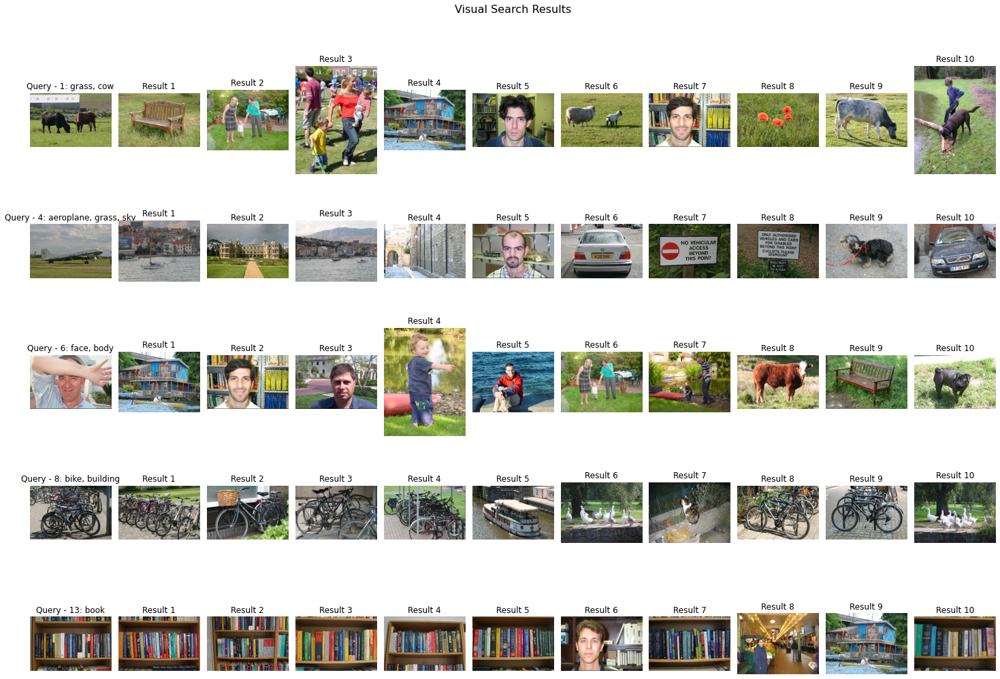

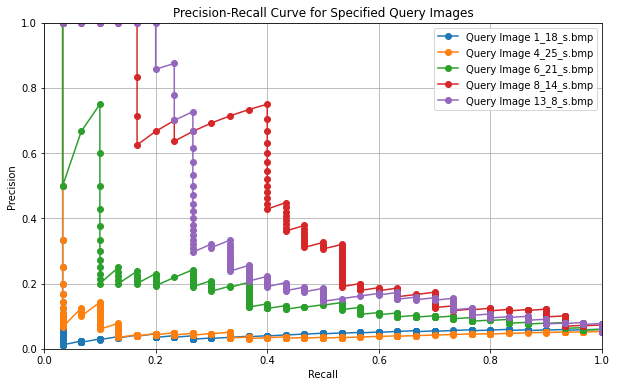

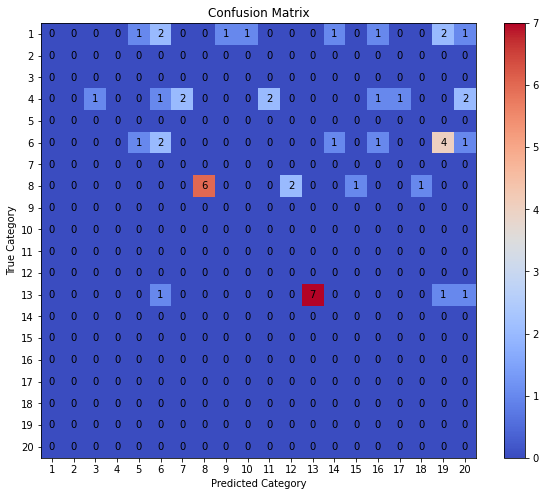

In [4]:
# 4 Specify the exact query images, PR curve, and Confusion Matrix

# Specify the folder containing descriptors
descriptor_folder = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/descriptors/globalRGBhisto'
IMAGES_PER_CATEGORY = 10  # Set this to the number of images to display per query

# Define category mappings
CATEGORY_LABELS = {
    1: "grass, cow",
    2: "tree, grass, sky",
    3: "building, sky",
    4: "aeroplane, grass, sky",
    5: "cow, grass, mount",
    6: "face, body",
    7: "car, building",
    8: "bike, building",
    9: "sheep, grass",
    10: "flower",
    11: "sign",
    12: "bird, sky, grass, water",
    13: "book",
    14: "chair",
    15: "cat",
    16: "dog",
    17: "road, building",
    18: "water, boat",
    19: "body, face",
    20: "water, boat, sky, mount"
}

# Load all descriptors from the specified directory
ALLFEAT = []
ALLFILES = []
ALLCATEGORIES = []

for filename in os.listdir(descriptor_folder):
    if filename.endswith(".mat"):
        file_path = os.path.join(descriptor_folder, filename)
        data = sio.loadmat(file_path)
        ALLFEAT.append(data['F'].flatten())
        ALLFILES.append(filename.replace('.mat', '.bmp'))
        category_num = int(filename.split('_')[0])  # Extracting category number from filename
        ALLCATEGORIES.append(category_num)

ALLFEAT = np.array(ALLFEAT)

QUERY_IMAGES = [
    "1_18_s.bmp", 
    "4_25_s.bmp", 
    "6_21_s.bmp", 
    "8_14_s.bmp", 
    "13_8_s.bmp"
]

# Initialize precision and recall lists
precision_list = []
recall_list = []

# Set up the figure layout
fig, axes = plt.subplots(len(QUERY_IMAGES), IMAGES_PER_CATEGORY + 1, figsize=(20, 3 * len(QUERY_IMAGES)))
fig.suptitle("Visual Search Results", fontsize=16)

# Loop through the list of specific query images
for idx, query_image_name in enumerate(QUERY_IMAGES):
    # Find the index of the query image in the ALLFILES list
    query_idx = None
    for i, filename in enumerate(ALLFILES):
        if filename.endswith(query_image_name):
            query_idx = i
            break
    
    if query_idx is not None:
        query = ALLFEAT[query_idx]

        # Compute distances between the query and all other images
        distances = []
        for i in range(len(ALLFEAT)):
            distance = cvpr_compare(query, ALLFEAT[i])
            distances.append((distance, i))
        
        # Sort distances to find the top results
        distances.sort(key=lambda x: x[0])
        
        # Display the query image
        query_image = cv2.imread(os.path.join(DATASET_FOLDER, 'Images', ALLFILES[query_idx]))
        query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
        
        # Set title to include category number and label
        category_num = ALLCATEGORIES[query_idx]
        category_name = CATEGORY_LABELS[category_num]
        axes[idx, 0].imshow(query_image)
        axes[idx, 0].set_title(f"Query - {category_num}: {category_name}")
        axes[idx, 0].axis('off')
        
        # Show top results for the query
        for i in range(IMAGES_PER_CATEGORY):
            img_index = distances[i + 1][1]  # Skipping the query image itself
            img = cv2.imread(os.path.join(DATASET_FOLDER, 'Images', ALLFILES[img_index]))
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            axes[idx, i + 1].imshow(img)
            axes[idx, i + 1].axis('off')
            axes[idx, i + 1].set_title(f"Result {i + 1}")

        # Precision-Recall Calculation for this query image (across the entire dataset)
        relevant_items = [i for i in range(len(ALLFILES)) if ALLCATEGORIES[i] == category_num]
        total_relevant = len(relevant_items)

        precision_category = []
        recall_category = []

        for n in range(1, len(ALLFILES) + 1):
            retrieved = distances[:n]
            retrieved_categories = [ALLCATEGORIES[i[1]] for i in retrieved]
            relevant_retrieved = len([cat for cat in retrieved_categories if cat == category_num])

            # Precision and Recall calculations
            precision = relevant_retrieved / n
            recall = relevant_retrieved / total_relevant if total_relevant > 0 else 0
            
            precision_category.append(precision)
            recall_category.append(recall)

        precision_list.append(precision_category)
        recall_list.append(recall_category)

# Adjust layout and display
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Plot Precision-Recall curve for each of the query images
plt.figure(figsize=(10, 6))
for idx, query_image_name in enumerate(QUERY_IMAGES):
    plt.plot(recall_list[idx], precision_list[idx], marker='o', label=f"Query Image {query_image_name}")

plt.title('Precision-Recall Curve for Specified Query Images')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid()
plt.legend()
plt.show()

import numpy as np
import matplotlib.pyplot as plt

# Initialize confusion matrix for 20 categories
confusion_matrix = np.zeros((20, 20), dtype=int)  # 20 categories

# Iterate over the query images and update the confusion matrix
for idx, query_image_name in enumerate(QUERY_IMAGES):
    # Get the true category of the current query image
    query_idx = None
    for i, filename in enumerate(ALLFILES):
        if filename.endswith(query_image_name):
            query_idx = i
            break
    
    if query_idx is not None:
        query_category = ALLCATEGORIES[query_idx]  # True category of the query
        
        # Sort distances to find the top results (exclude the query itself)
        distances = []
        for i in range(len(ALLFEAT)):
            distance = cvpr_compare(ALLFEAT[query_idx], ALLFEAT[i])
            distances.append((distance, i))
        
        distances.sort(key=lambda x: x[0])  # Sort by distance (ascending)
        
        # Update confusion matrix: Compare predicted category for top results
        for i in range(IMAGES_PER_CATEGORY):
            predicted_category = ALLCATEGORIES[distances[i + 1][1]]  # Skipping query image itself
            confusion_matrix[query_category - 1, predicted_category - 1] += 1  # Update matrix cell

# Plot the confusion matrix with annotations using the 'coolwarm' color map
plt.figure(figsize=(10, 8))
plt.imshow(confusion_matrix, cmap='coolwarm', interpolation='nearest')  # 'coolwarm' color map
plt.title("Confusion Matrix")
plt.xlabel("Predicted Category")
plt.ylabel("True Category")
plt.colorbar()
plt.xticks(np.arange(20), labels=np.arange(1, 21))
plt.yticks(np.arange(20), labels=np.arange(1, 21))

# Annotate each cell with the numeric value
for i in range(20):
    for j in range(20):
        plt.text(j, i, str(confusion_matrix[i, j]), ha="center", va="center", color="black")

plt.show()


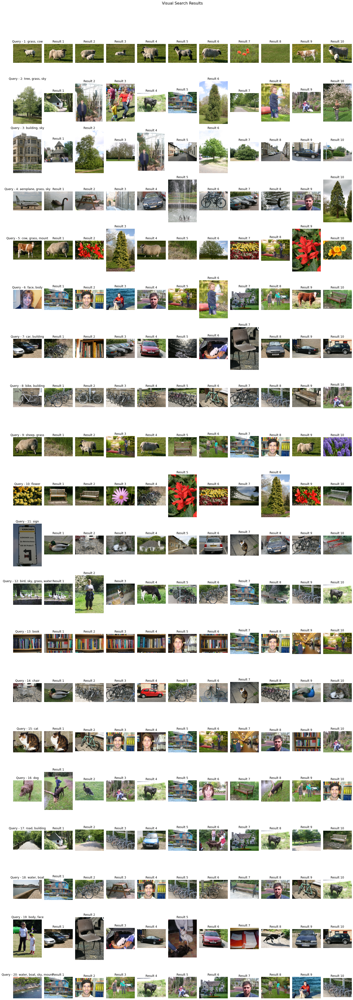

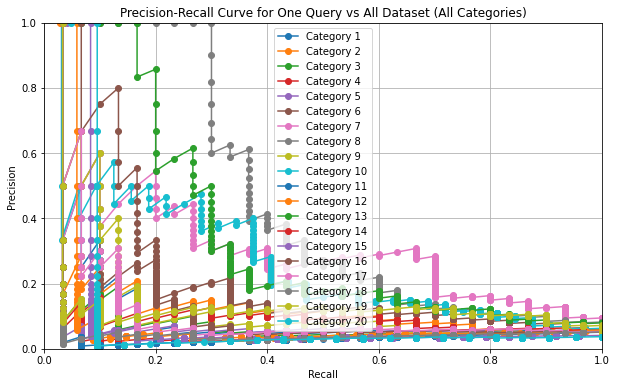

In [5]:
# Print all query images from each category. 
import os
import numpy as np
import scipy.io as sio
import cv2
import matplotlib.pyplot as plt
from random import randint

# Define category mappings
CATEGORY_LABELS = {
    1: "grass, cow",
    2: "tree, grass, sky",
    3: "building, sky",
    4: "aeroplane, grass, sky",
    5: "cow, grass, mount",
    6: "face, body",
    7: "car, building",
    8: "bike, building",
    9: "sheep, grass",
    10: "flower",
    11: "sign",
    12: "bird, sky, grass, water",
    13: "book",
    14: "chair",
    15: "cat",
    16: "dog",
    17: "road, building",
    18: "water, boat",
    19: "body, face",
    20: "water, boat, sky, mount"
}

DESCRIPTOR_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/descriptors'
DESCRIPTOR_SUBFOLDER = 'globalRGBhisto'
IMAGE_FOLDER = '/user/HS402/rk01219/Downloads/Sem1/CV_01/0_1/msrc_objcategimagedatabase_v2/MSRC_ObjCategImageDatabase_v2/'

# Load all descriptors
ALLFEAT = []
ALLFILES = []
ALLCATEGORIES = []  # Track categories for each image
for filename in os.listdir(os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER)):
    if filename.endswith('.mat'):
        img_path = os.path.join(DESCRIPTOR_FOLDER, DESCRIPTOR_SUBFOLDER, filename)
        img_actual_path = os.path.join(IMAGE_FOLDER, 'Images', filename).replace(".mat", ".bmp")
        img_data = sio.loadmat(img_path)
        ALLFILES.append(img_actual_path)
        ALLFEAT.append(img_data['F'][0])  # Assuming F is a 1D array
        category = int(filename.split('_')[0])  # Assuming category is part of the filename
        ALLCATEGORIES.append(category)

# Convert ALLFEAT to a numpy array
ALLFEAT = np.array(ALLFEAT)

# Define the comparison function
def cvpr_compare(query, candidate):
    return np.linalg.norm(query - candidate)  # Example using Euclidean distance

# Number of images to display per category
IMAGES_PER_CATEGORY = 10
N_CATEGORIES = len(CATEGORY_LABELS)

# Initialize precision and recall lists
precision_list = []
recall_list = []

# Set up the figure layout
fig, axes = plt.subplots(N_CATEGORIES, IMAGES_PER_CATEGORY + 1, figsize=(20, 3 * N_CATEGORIES))
fig.suptitle("Visual Search Results", fontsize=16)

# Loop through each category
for category_num in range(1, N_CATEGORIES + 1):
    # Filter images that belong to the current category
    category_indices = [i for i, file in enumerate(ALLFILES) if ALLCATEGORIES[i] == category_num]
    
    # If there are images in this category
    if category_indices:
        # Select a random query image from this category
        query_idx = category_indices[randint(0, len(category_indices) - 1)]
        query = ALLFEAT[query_idx]
        
        # Compute distances between the query and all other images
        distances = []
        for i in range(len(ALLFEAT)):
            distance = cvpr_compare(query, ALLFEAT[i])
            distances.append((distance, i))
        
        # Sort distances to find the top results
        distances.sort(key=lambda x: x[0])
        
        # Display the query image with its category
        query_image = cv2.imread(ALLFILES[query_idx])
        query_image = cv2.cvtColor(query_image, cv2.COLOR_BGR2RGB)
        
        # Set title to include category number and label
        category_name = CATEGORY_LABELS[category_num]
        axes[category_num - 1, 0].imshow(query_image)
        axes[category_num - 1, 0].set_title(f"Query - {category_num}: {category_name}")
        axes[category_num - 1, 0].axis('off')
        
        # Show top results for the query
        for i in range(IMAGES_PER_CATEGORY):
            img_index = distances[i + 1][1]  # Skipping the query image itself
            img = cv2.imread(ALLFILES[img_index])
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            
            axes[category_num - 1, i + 1].imshow(img)
            axes[category_num - 1, i + 1].axis('off')
            axes[category_num - 1, i + 1].set_title(f"Result {i + 1}")

        # Precision-Recall Calculation for this category (across the entire dataset)
        relevant_items = [i for i in range(len(ALLFILES)) if ALLCATEGORIES[i] == category_num]
        total_relevant = len(relevant_items)

        precision_category = []
        recall_category = []

        for n in range(1, len(ALLFILES) + 1):
            retrieved = distances[:n]
            retrieved_categories = [ALLCATEGORIES[i[1]] for i in retrieved]
            relevant_retrieved = len([cat for cat in retrieved_categories if cat == category_num])

            # Precision and Recall calculations
            precision = relevant_retrieved / n
            recall = relevant_retrieved / total_relevant if total_relevant > 0 else 0
            
            precision_category.append(precision)
            recall_category.append(recall)

        precision_list.append(precision_category)
        recall_list.append(recall_category)

# Adjust layout and display
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

# Plot Precision-Recall curve for one query vs all dataset for each category
plt.figure(figsize=(10, 6))
for idx, category in enumerate(range(1, N_CATEGORIES + 1)):
    plt.plot(recall_list[idx], precision_list[idx], marker='o', label=f"Category {category}")

plt.title('Precision-Recall Curve for One Query vs All Dataset (All Categories)')
plt.xlabel('Recall')
plt.ylabel('Precision')
plt.xlim([0, 1])
plt.ylim([0, 1])
plt.grid()
plt.legend()
plt.show()
